In [ ]:
#getting the files from Google Drive like we did in our Astronomy class
#No need to do this if you're running this on your local Jupyter
from google.colab import drive
drive.mount('/content/drive')



In [1]:
# Recommended settings

import scipy
from scipy.optimize import minimize
import re
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
from matplotlib import cm
import math as m
%matplotlib inline


#Settings
data_path = "vec_mod_data.txt" #make sure your ASCII output file is in the same directory as the notebook
#or boot it up using your drive and Google Colab, and make sure the path refers to your drive
data_path_unmorphed = 'unmorphed_data.txt'

function_def = vec_mod_func_def.py #comment this out if you are getting the file from your Google Drive

max_voltage = 1 #set the maximum voltage for VI and VQ

In [2]:
# Here you can control the font size in plots.
# Cannot be put in the same cell as "%matplotlib inline"
plt.rcParams['font.size'] = 15 ## font size



In [3]:
#run this to define all the used functions, make sure the 

%run function_def

Total transformation from S13 to Voltages
Moved midpoint to origin:  [2.4987212021709837e-09, 2.498523610228176e-09]
Slope:  -3.958406745600724e-05
Rotation Angle:  3.95840674353325e-05  radians
Rotation Matrix:
 [[ 9.99999999e-01  3.95840674e-05]
 [-3.95840674e-05  9.99999999e-01]]
Scaling factor:  0.9999999999999147
Moved array to upper right quadrant:  [0.5, 0.5]
Second Scaling factor:  1.00015103921026
X and Y Deltas for final adjustments:  [0, 0]
Moved midpoint to domain center:  [5.551115123125783e-17, 0.0]
Scaled horizontally by factor:  1.0
Max X:  1.0
Max Y:  1.0
Min X:  0.0
Min Y:  0.0
________________________


,R2,R1,S13,deg,rad,dB,x,y,VI,VQ
0,1.000000e-10,1.000000e-10,0.707,44.997732,0.785359,-3.011612,0.499944,0.499905,1.000000e+00,1.000000e+00
1,1.000000e-10,1.232847e-10,0.707,44.997732,0.785359,-3.011612,0.499944,0.499905,1.000000e+00,1.000000e+00
2,1.000000e-10,1.519911e-10,0.707,44.997732,0.785359,-3.011612,0.499944,0.499905,1.000000e+00,1.000000e+00
3,1.000000e-10,1.873817e-10,0.707,44.997732,0.785359,-3.011612,0.499944,0.499905,1.000000e+00,1.000000e+00
4,1.000000e-10,2.310130e-10,0.707,44.997732,0.785359,-3.011612,0.499944,0.499905,1.000000e+00,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...
48836,1.000000e+10,4.328761e+09,0.707,224.997732,-2.356234,-3.011612,-0.499944,-0.499905,8.326673e-16,6.550649e-09
48837,1.000000e+10,5.336699e+09,0.707,224.997732,-2.356234,-3.011612,-0.499944,-0.499905,8.881784e-16,4.369087e-09
48838,1.000000e+10,6.579332e+09,0.707,224.997732,-2.356234,-3.011612,-0.499944,-0.499905,8.881784e-16,2.599556e-09
48839,1.000000e+10,8.111308e+09,0.707,224.997732,-2.356234,-3.011612,-0.499944,-0.499905,8.326673e-16,1.164234e-09


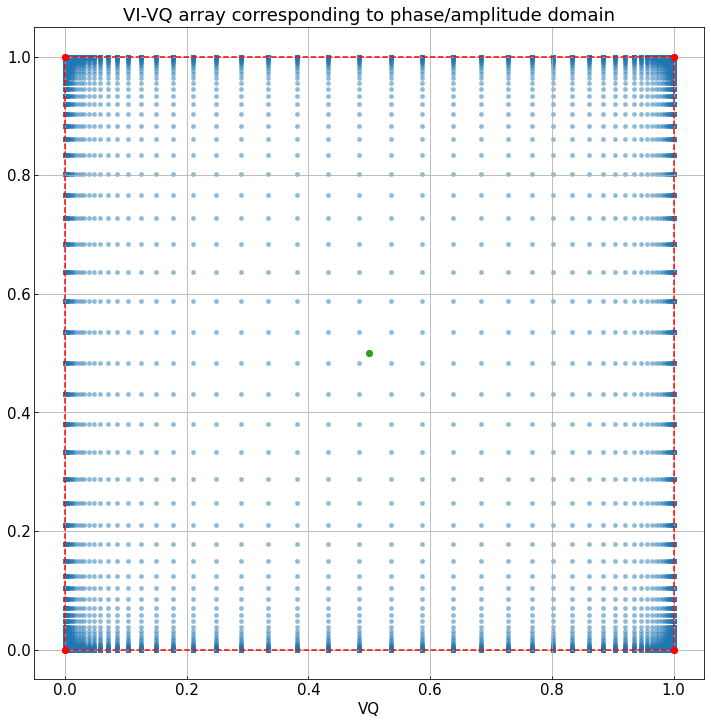

In [4]:
#This is where all of the functions are actually being called, and this should output a transformation plot for inspection,
#as well as a final plot for VI and VQ, and the dataframe that serves as a lookup table for the phase and dB amplitude

#In this cell we are taking the output from an ideal, unmorphed vector mod response in order to have a comparison point with our real one

data = ASCII_cleaner(data_path_unmorphed)
df_ideal = create_df(ASCII_cleaner(data_path_unmorphed))

VI, VQ, angle, scaling_factor, final_scaling_factor, peaks_x, peaks_y, rot_mat = S13_to_V(df_ideal['x'],df_ideal['y'], df=df_ideal, max_voltage=max_voltage,morphed=False)

df_ideal['VI'] = VI
df_ideal['VQ'] = VQ

VI_unmorphed = VI
VQ_unmorphed = VQ

plot_cart_array(VI, VQ, peaks_x, peaks_y,max_voltage=max_voltage, xlabel="VI", ylabel="VQ", title="VI-VQ array corresponding to phase/amplitude domain")
df_ideal

Total transformation from S13 to Voltages
Moved midpoint to origin:  [0.07595550241146348, -0.0021383886560573375]
Slope:  -0.7949420704953579
Rotation Angle:  0.6716492205424156  radians
Rotation Matrix:
 [[ 0.78279646  0.62227784]
 [-0.62227784  0.78279646]]
Rotation Matrix:
 [[ 6.123234e-17 -1.000000e+00]
 [ 1.000000e+00  6.123234e-17]]
Rotation Angle:  90  degrees
Scaling factor:  0.9599999999999156
Moved array to upper right quadrant:  [0.5, 0.5]
Second Scaling factor:  1.0215942493306887
X and Y Deltas for final adjustments:  [0, 0.008802161515888862]
Moved midpoint to domain center:  [-0.0010243743987710108, 0.0]
Scaled horizontally by factor:  1.1547077093615417
Max X:  1.0
Max Y:  1.0
Min X:  0.0
Min Y:  0.0
________________________
Slope:  -0.7949420704953579
Rotation Angle:  -0.6716492205424156  radians
Rotation Matrix:
 [[ 0.78279646  0.62227784]
 [-0.62227784  0.78279646]]
Rotation Matrix:
 [[ 6.123234e-17 -1.000000e+00]
 [ 1.000000e+00  6.123234e-17]]
Rotation Angle:  90 

,R2,R1,S13,deg,rad,dB,x,y,VI,VQ,VI_unmorphed,VQ_unmorphed,error
0,1.000000e-10,1.000000e-10,0.655360,93.369921,1.629613,-3.670405,-0.038524,0.654227,1.000000,9.796557e-01,1.000000e+00,1.000000e+00,0.020344
1,1.000000e-10,1.232847e-10,0.655360,93.369921,1.629613,-3.670405,-0.038524,0.654227,1.000000,9.796557e-01,1.000000e+00,1.000000e+00,0.020344
2,1.000000e-10,1.519911e-10,0.655360,93.369921,1.629613,-3.670405,-0.038524,0.654227,1.000000,9.796557e-01,1.000000e+00,1.000000e+00,0.020344
3,1.000000e-10,1.873817e-10,0.655360,93.369921,1.629613,-3.670405,-0.038524,0.654227,1.000000,9.796557e-01,1.000000e+00,1.000000e+00,0.020344
4,1.000000e-10,2.310130e-10,0.655360,93.369921,1.629613,-3.670405,-0.038524,0.654227,1.000000,9.796557e-01,1.000000e+00,1.000000e+00,0.020344
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48836,1.000000e+10,4.328761e+09,0.667137,288.854589,-1.241722,-3.515698,0.215597,-0.631340,0.039446,7.611625e-09,8.326673e-16,6.550649e-09,0.039446
48837,1.000000e+10,5.336699e+09,0.667137,288.854589,-1.241722,-3.515698,0.215597,-0.631340,0.039446,5.076727e-09,8.881784e-16,4.369087e-09,0.039446
48838,1.000000e+10,6.579332e+09,0.667137,288.854589,-1.241722,-3.515698,0.215597,-0.631340,0.039446,3.020593e-09,8.881784e-16,2.599556e-09,0.039446
48839,1.000000e+10,8.111308e+09,0.667137,288.854589,-1.241722,-3.515698,0.215597,-0.631340,0.039446,1.352799e-09,8.326673e-16,1.164234e-09,0.039446


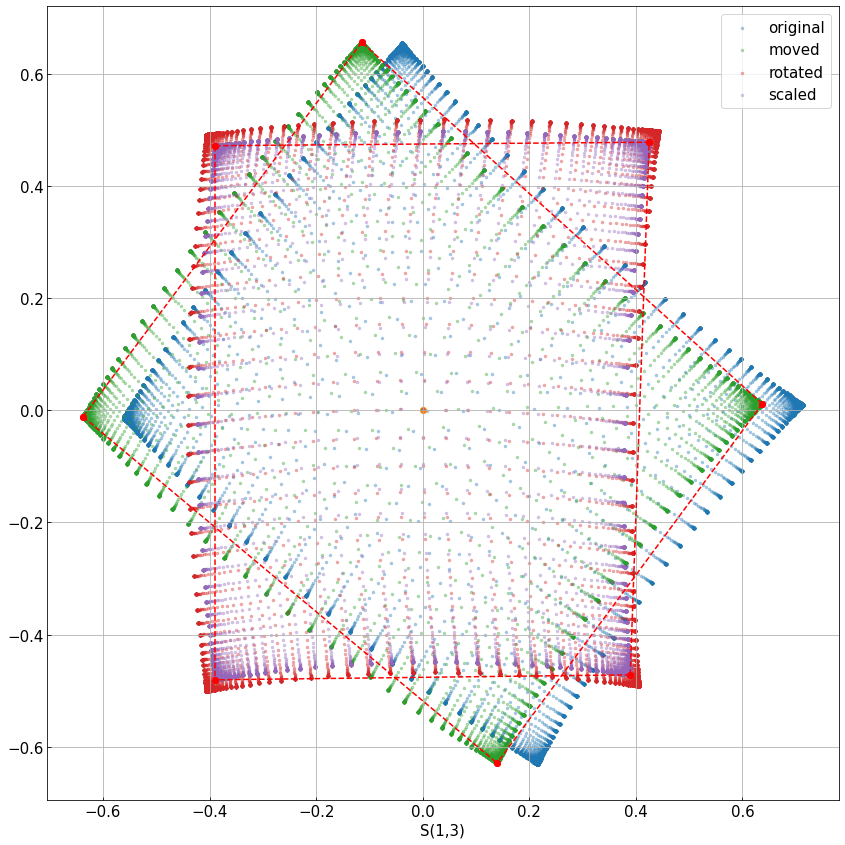

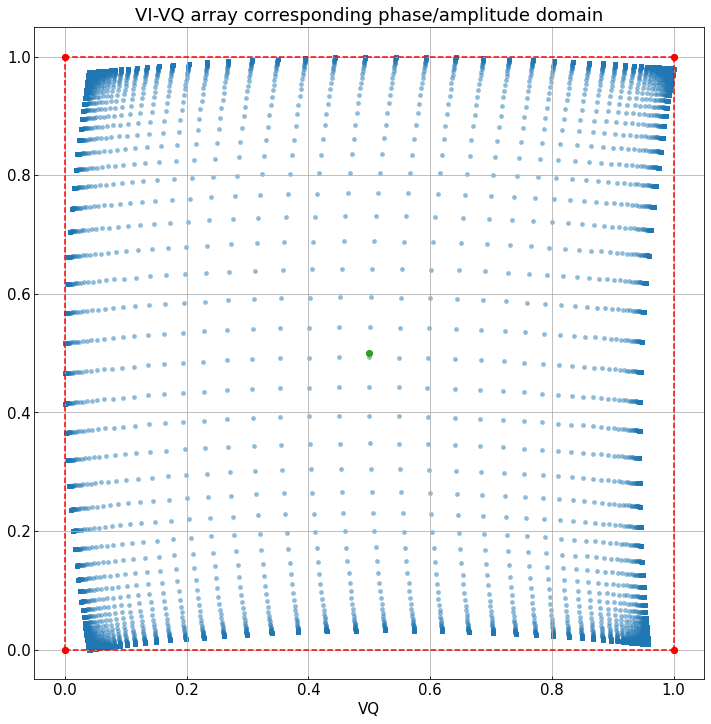

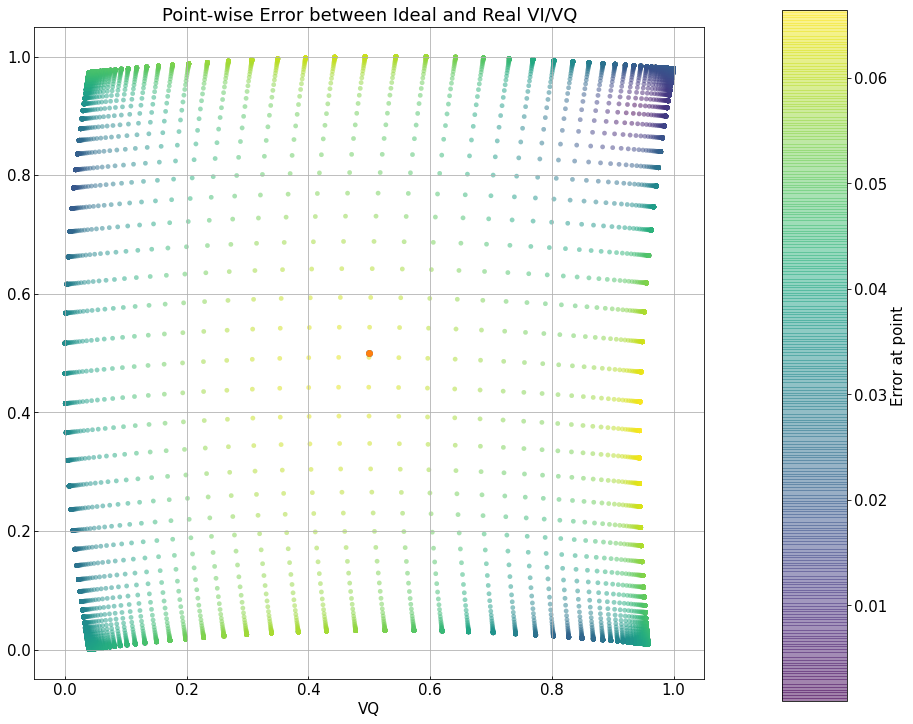

In [9]:
#This is where all of the functions are actually being called, and this should output a transformation plot for inspection,
#as well as a final plot for VI and VQ, and the dataframe that serves as a lookup table for the phase and dB amplitude

#In this cell, we are taking the real response and plotting it as well as comparing it to the ideal one

df = create_df(ASCII_cleaner(data_path))

VI, VQ, angle, scaling_factor, final_scaling_factor, peaks_x, peaks_y, rot_mat = S13_to_V(df['x'],df['y'], df=df, max_voltage=max_voltage)

df['VI'] = VI
df['VQ'] = VQ
df['VI_unmorphed'] = df_ideal['VI']
df['VQ_unmorphed'] = df_ideal['VQ']


plot_S2V_transformation(df=df, markersize=10, alpha=0.4, morphed=True)
plot_cart_array(VI, VQ, peaks_x, peaks_y, max_voltage=max_voltage, xlabel="VI", ylabel="VQ", title="VI-VQ array corresponding phase/amplitude domain")

plot_error(df)
plot_cart_array(VI, VQ, peaks_x, peaks_y, xlabel="VI", ylabel="VQ", colormap='viridis', color_intensity=df['error'], title="Point-wise Error between Ideal and Real VI/VQ")

df_out= df[['VI', "VQ", "deg", "dB", "error"]]

df

In [10]:
#This is the final, interactive plot where we can look up our dB and phase values for every VI and VQ point represented
!pip install -q "plotly"
import plotly.express as px


fig =px.scatter(df_out, x="VI", y="VQ", color="error", hover_data=['dB', 'deg'], width=800, height=800)
fig.show()